In [1]:
import os
import numpy as np
# import tensorflow as tf
import PIL
import sys
sys.path.append('/home/damon/Github/models_local/research/')
sys.path.append('/home/damon/Github/models_local/research/slim/')
# slim = tf.contrib.slim
import matplotlib.pyplot as plt
import matplotlib
%matplotlib inline
%config InlineBackend.figure_format = 'svg'
%load_ext autoreload
%autoreload 2

import sys; sys.path.append('/home/damon/detorch/')
# import visualization_utils, debug_utils

data_dir = '/home/damon/DATASETS/Drone2019/VisDrone2019-DET/VisDrone2018-DET-train/'
images_path = os.path.join(data_dir, 'images')
annos_path = os.path.join(data_dir, 'annotations')
assert(os.path.exists(images_path))

# TODO list

NOTE: **ERROR anno: index 346, box 11**

## load stat from disk

try to load stat from ~/Documents/VisDroneStat, if deleted, then run that BIG cell

usable: 
    **fnames, image_sizes, infos, boxes_info**

usable function:
1. def get_image_from_fname(fname):
2. def draw_and_visualize_by_index(index):

In [2]:
import pickle
def save_obj(obj, name='VisDroneStat'):
    with open('/home/damon/Documents/obj'+ name + '.pkl', 'wb') as f:
        pickle.dump(obj, f, pickle.HIGHEST_PROTOCOL)

def load_obj(name='VisDroneStat'):
    with open('/home/damon/Documents/obj' + name + '.pkl', 'rb') as f:
        return pickle.load(f)
    
all_dict = load_obj()
fnames = all_dict['fnames']; image_sizes = all_dict['image_sizes']; infos = all_dict['infos']; 
boxes_info = all_dict['boxes_info']
def get_image_from_ind(ind):
    return PIL.Image.open(os.path.join(images_path, fnames[ind]))
def draw_and_visualize_by_index(index):
    img = get_image_from_fname(fnames[index])
    visualization_utils.draw_bounding_boxes_on_image(img, boxes_info[index])
    return img

In [14]:
fnames, image_sizes, infos = [], [], [] # size:(w,h)
boxes_info = [] # box convension y1 x1 y2 x2

def get_image_from_fname(fname):
    return PIL.Image.open(os.path.join(images_path, fname))
def draw_and_visualize_by_index(index):
    img = get_image_from_fname(fnames[index])
    visualization_utils.draw_bounding_boxes_on_image(img, boxes_info[index])
    return img
import io, PIL
if (not fnames) or (not infos) or (not image_sizes) or (not boxes_info):
    print('Not found dict, need loading')
    for i,anno in enumerate(os.listdir(annos_path)):
        if i % 1000 == 0:
            print('processing', i)
        stem = anno.split('.')[0]
        anno_full = os.path.join(annos_path, anno)
        img_full = os.path.join(images_path, stem + '.jpg')
        if not os.path.exists(img_full):
            continue
        # add fname
        fnames.append(stem+'.jpg')
        # add info
        with open(anno_full, 'r') as f:
            lines = f.readlines()
            lines = [v.strip('\n') for v in lines]
            lines = [v.split(',') for v in lines]
            lines = np.asarray(lines)[:, :8].astype(np.int32)
            infos.append(lines)
        with tf.gfile.GFile(img_full, 'rb') as fid:
            encoded_jpg = fid.read()
        encoded_jpg_io = io.BytesIO(encoded_jpg)
        # add image size
        with PIL.Image.open(encoded_jpg_io) as image:
            image_sizes.append(image.size)
        # add box_info
        x1, y1, w, h, sc, cls, trun, occ = np.split(lines, 8, axis=1)
        y2 = y1 + h
        x2 = x1 + w
        width, height = image.size
        xmin = []
        ymin = []
        xmax = []
        ymax = []
        for i in range(lines.shape[0]):
            xmin.append(float(x1[i]) / width)
            ymin.append(float(y1[i]) / height)
            xmax.append(float(x2[i]) / width)
            ymax.append(float(y2[i]) / height)
        boxes_info.append(np.stack([ymin, xmin, ymax, xmax], axis=1))
    all_dict = {
        'fnames': fnames, 'image_sizes': image_sizes, 'infos': infos, 'boxes_info':boxes_info
    }
    save_obj(all_dict)
    print("and also saved")
else:
    print("Found, use exist")

Not found dict, need loading
processing 0


NameError: name 'tf' is not defined

# Get max/min num of boxes

In [3]:
images = np.asanyarray(image_sizes)

print(image_sizes[10])  # Max size index: 10
print(image_sizes[2790])  # Min index: 2790

(2000, 1500)
(480, 360)


## Resolution hist

In [4]:
d = {}
for sz in image_sizes:
    try:
        d[sz] += 1
    except KeyError:
        d[sz] = 1
print(d)

{(1400, 1050): 2498, (1400, 788): 1299, (1360, 765): 743, (960, 540): 250, (2000, 1500): 772, (1916, 1078): 537, (1920, 1080): 339, (1398, 1048): 30, (1389, 1042): 1, (1344, 756): 1, (480, 360): 1}


In [11]:
d

{(1400, 1050): 2498,
 (1400, 788): 1299,
 (1360, 765): 743,
 (960, 540): 250,
 (2000, 1500): 772,
 (1916, 1078): 537,
 (1920, 1080): 339,
 (1398, 1048): 30,
 (1389, 1042): 1,
 (1344, 756): 1,
 (480, 360): 1}

In [13]:
fnames[image_sizes.index((1389, 1042))]

'9999937_00000_d_0000016.jpg'

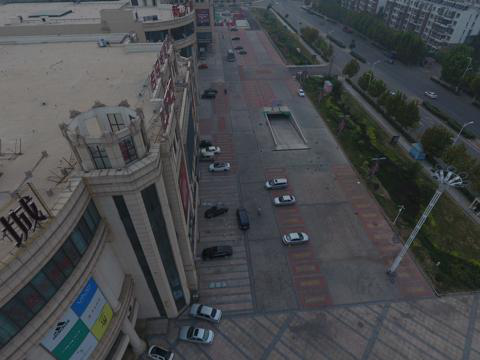

In [8]:
get_image_from_ind(image_sizes.index((480, 360)))

In [5]:
d

{(1400, 1050): 2498,
 (1400, 788): 1299,
 (1360, 765): 743,
 (960, 540): 250,
 (2000, 1500): 772,
 (1916, 1078): 537,
 (1920, 1080): 339,
 (1398, 1048): 30,
 (1389, 1042): 1,
 (1344, 756): 1,
 (480, 360): 1}

In [5]:
set(image_sizes) # w, h

{(480, 360),
 (960, 540),
 (1344, 756),
 (1360, 765),
 (1389, 1042),
 (1398, 1048),
 (1400, 788),
 (1400, 1050),
 (1916, 1078),
 (1920, 1080),
 (2000, 1500)}

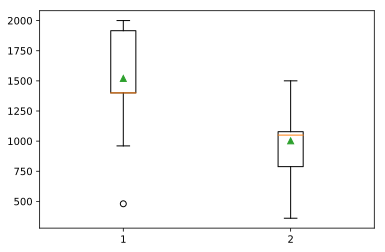

In [6]:
plt.boxplot([[v[0] for v in image_sizes], [v[1] for v in image_sizes]], showmeans=True)
plt.show()

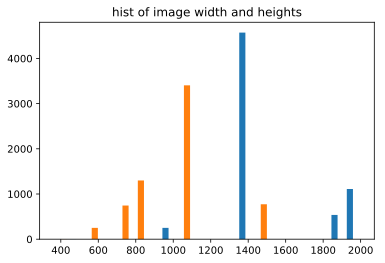

In [7]:
plt.hist(images, bins=20) # hist of image width and heights
plt.title('hist of image width and heights')
plt.show()

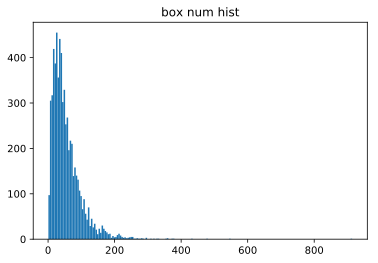

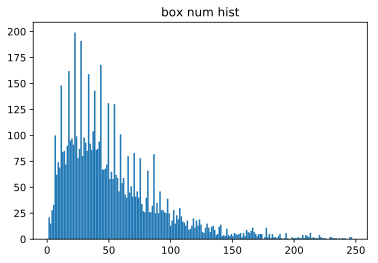

In [8]:
box_num = np.asarray([v.shape[0] for v in boxes_info])
plt.hist(box_num, bins=200)
plt.title('box num hist')
plt.show()

box_num = np.asarray([v.shape[0] for v in boxes_info])
box_num_part = box_num[box_num < 250]
plt.hist(box_num_part, bins=200)
plt.title('box num hist')
plt.show()

## Max box vis

In [9]:
print(sorted(box_num)[::-1][:20]) # max boxes

[914, 545, 478, 432, 378, 372, 360, 360, 356, 333, 329, 316, 307, 295, 294, 294, 288, 281, 281, 278]


In [10]:
max_box_ind = box_num.argmax()
min_box_ind = box_num.argmin()
print(fnames[max_box_ind], box_num[max_box_ind], image_sizes[max_box_ind])
print(fnames[min_box_ind], box_num[min_box_ind], image_sizes[min_box_ind])
ind = np.argwhere(box_num == 545).squeeze()
print(fnames[ind], box_num[ind], image_sizes[ind])

0000059_01886_d_0000114.jpg 914 (960, 540)
9999953_00000_d_0000203.jpg 1 (1400, 788)
0000137_02220_d_0000163.jpg 545 (1920, 1080)


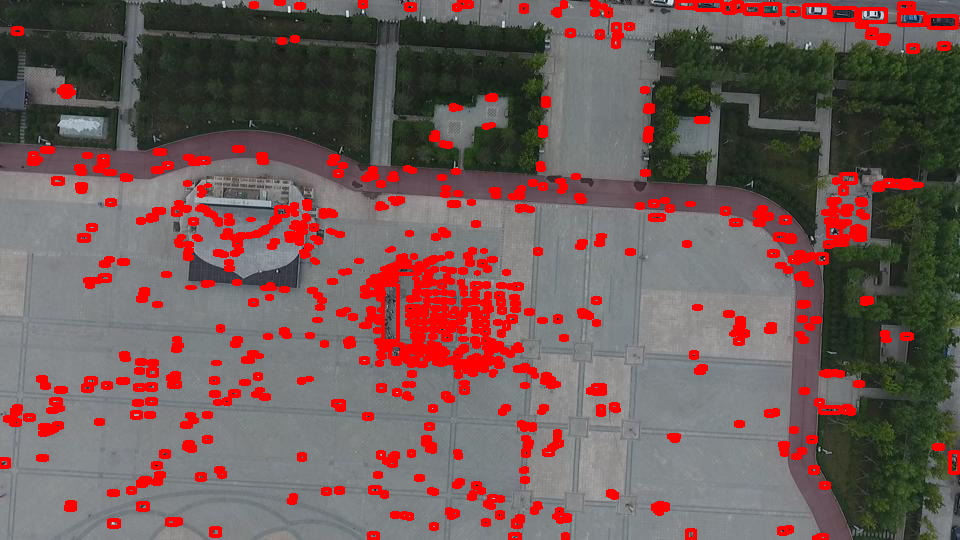

In [11]:
draw_and_visualize_by_index(max_box_ind)

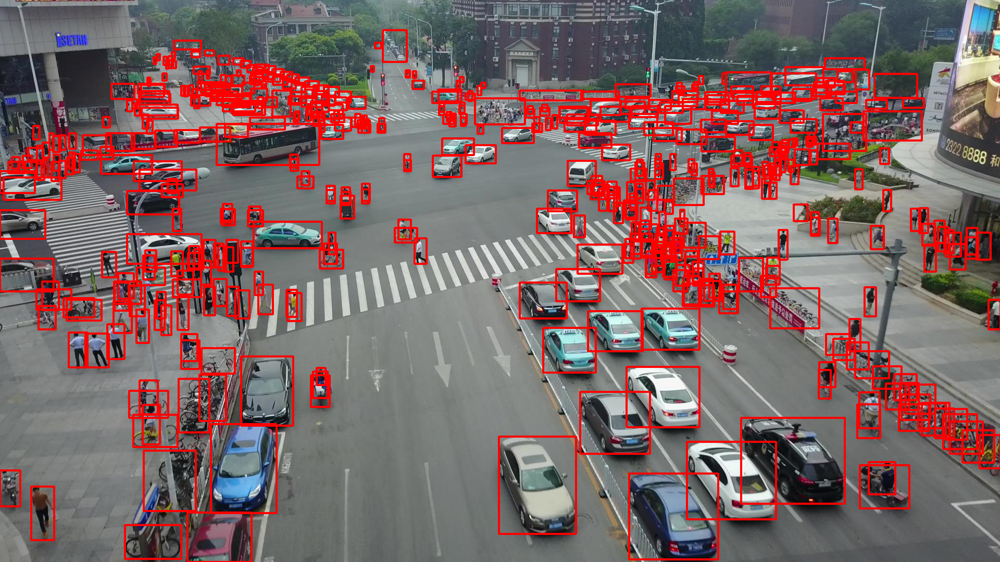

In [12]:
draw_and_visualize_by_index(ind) # Second largest

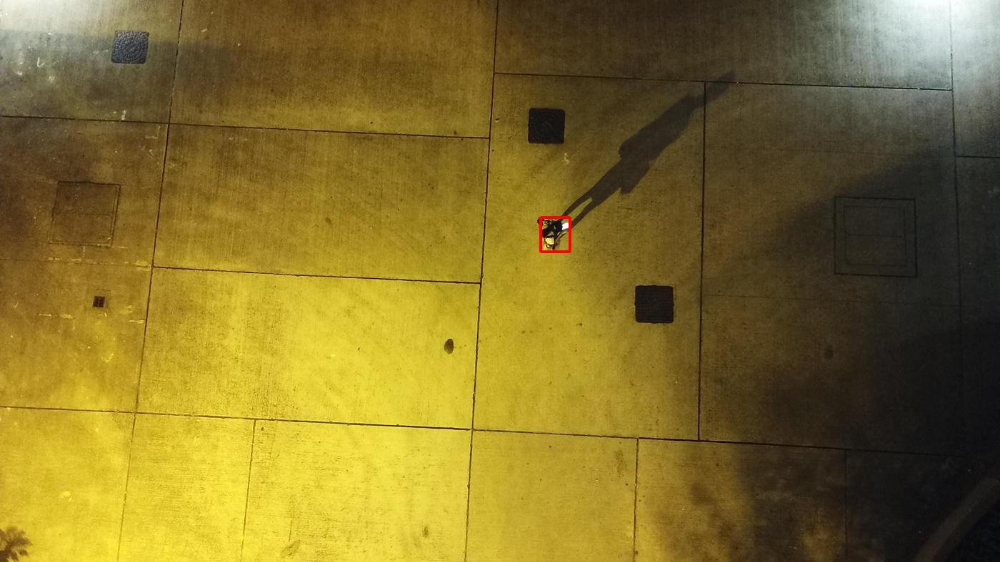

In [13]:
draw_and_visualize_by_index(min_box_ind)

## obj size hist and over classes

In [14]:
pixel_area = []
pixel_area_perc = []
for sz, boxes in zip(image_sizes, infos):
    x1, y1, w, h = np.split(boxes[:, :4], 4, axis=1)
    area = w * h
    pixel_area.append(area)
    pixel_area_perc.append(area.astype(np.float32) / (sz[0] * sz[1]))
avg_area = [np.mean(a) for a in pixel_area]
avg_area_perc = [np.mean(a) for a in pixel_area_perc]

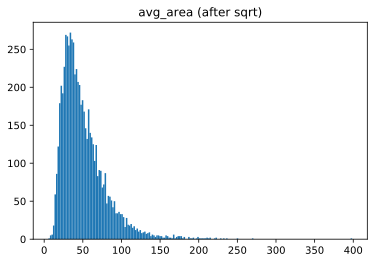

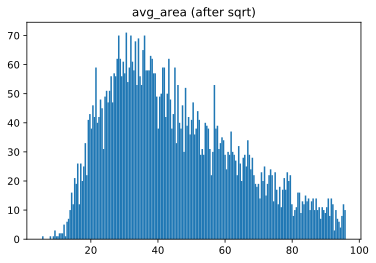

In [15]:
plt.hist(np.sqrt(avg_area), bins=200)
plt.title('avg_area (after sqrt)')
plt.show()
avg_sqrt = np.sqrt(avg_area)
plt.hist(avg_sqrt[avg_sqrt<96], bins=200)
plt.title('avg_area (after sqrt)')
plt.show()

0000076_02667_d_0000010.jpg 158838.5
ind:  4321


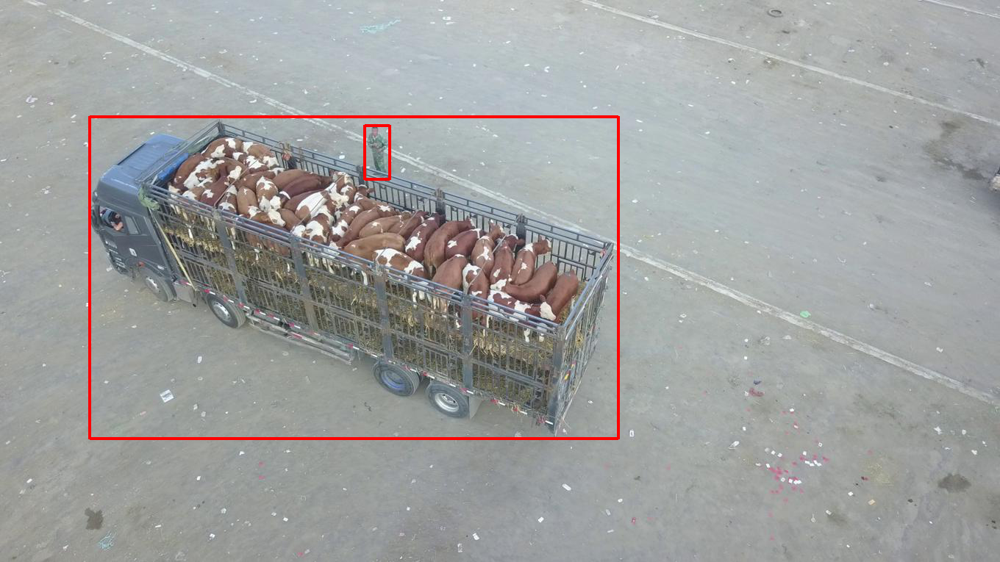

In [16]:
largest_avg_a_ind = np.argmax(avg_area)
print(fnames[largest_avg_a_ind], avg_area[largest_avg_a_ind])
print('ind: ', largest_avg_a_ind)
draw_and_visualize_by_index(largest_avg_a_ind)

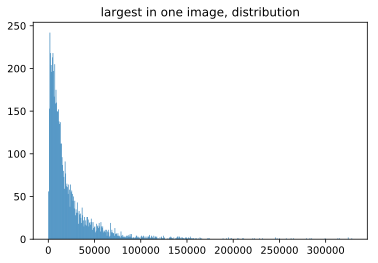

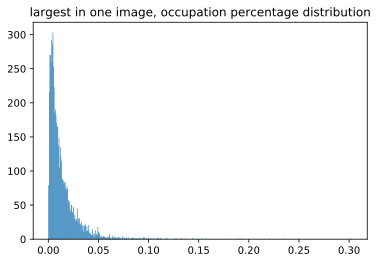

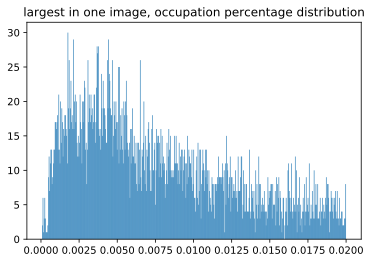

In [17]:
L_in_image = [np.max(a) for a in pixel_area]  # Largest in one image, list of int
L_in_image_box =[b[np.argmax(a)] for a, b in zip(pixel_area, boxes_info)]
L_in_image_ind = [np.argmax(a) for a in pixel_area]
plt.hist(L_in_image, bins=500)
plt.title('largest in one image, distribution')
plt.show()

L_in_image_perc = np.asarray([np.max(a) for a in pixel_area_perc])  # Largest in one image, list of int
plt.hist(L_in_image_perc, bins=500)
plt.title('largest in one image, occupation percentage distribution')
plt.show()

L_in_image_perc_part = L_in_image_perc[L_in_image_perc < 0.02]
plt.hist(L_in_image_perc_part, bins=500)
plt.title('largest in one image, occupation percentage distribution')
plt.show()

9999999_00348_d_0000153.jpg 44837.0
[310 680 416 790   1   4   0   0]
ind:  5108


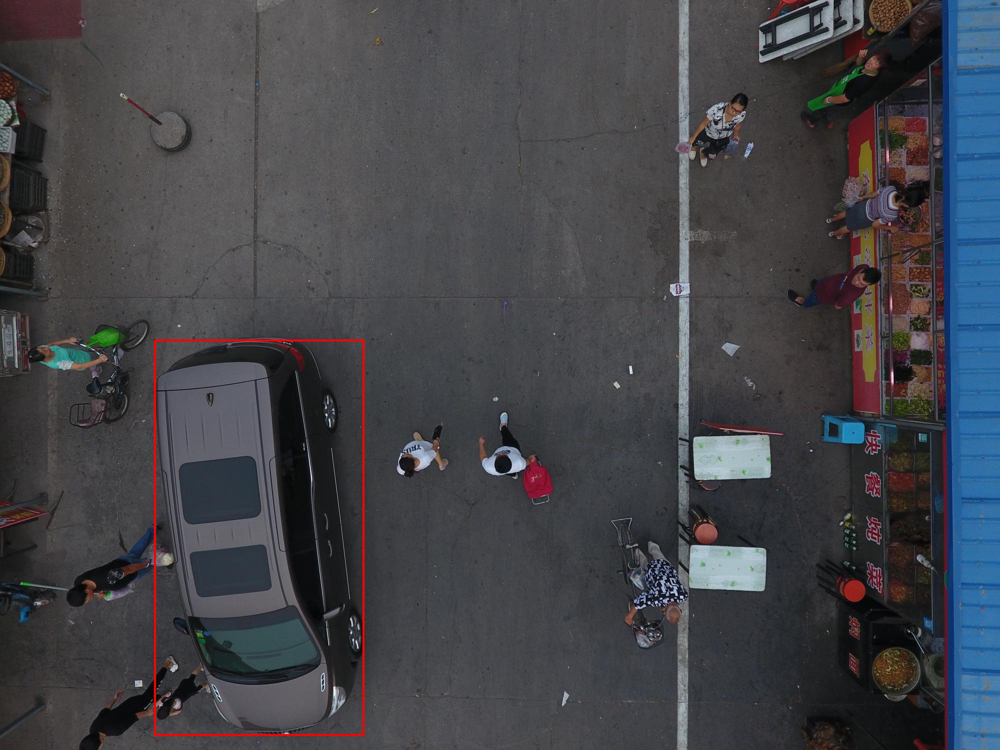

In [18]:
largest_sin_a_ind = np.argmax(L_in_image)
print(fnames[largest_sin_a_ind], avg_area[largest_sin_a_ind])

img = get_image_from_ind(largest_sin_a_ind)
visualization_utils.draw_bounding_box_on_image(img, *L_in_image_box[largest_sin_a_ind])
print(infos[largest_sin_a_ind][8])
print('ind: ', largest_sin_a_ind)
img

(960, 540)


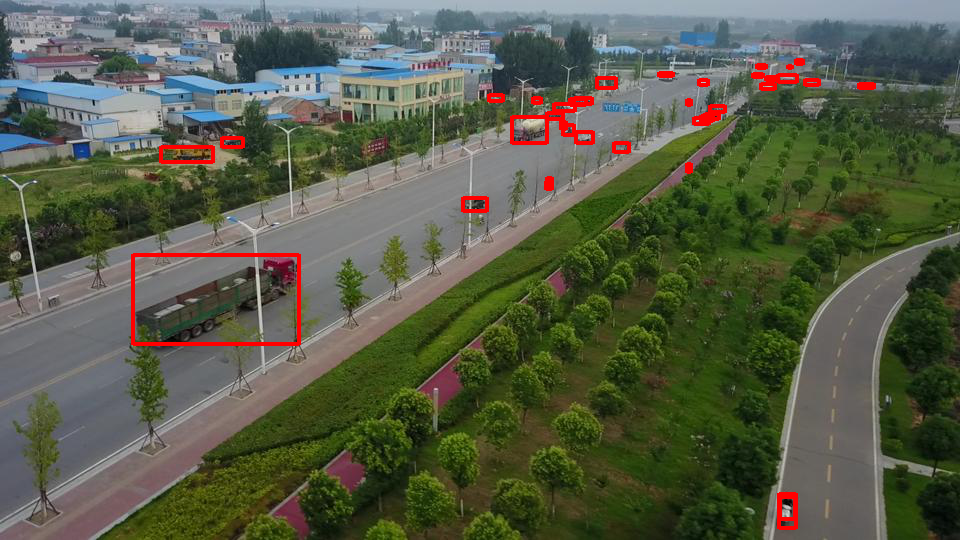

In [19]:
print(image_sizes[4])
draw_and_visualize_by_index(4)

## avg_box_area vs (#box, size)

### avg_box_area_perc  vs  #-of-Box : box数量和占图像面积没有什么联系

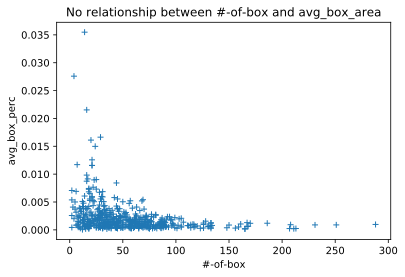

In [20]:
ran = np.random.choice(np.arange(len(box_num)),500)
plt.title('No relationship between #-of-box and avg_box_area'); plt.ylabel('avg_box_perc'); plt.xlabel('#-of-box')
plt.plot(box_num[ran], np.asarray(avg_area_perc)[ran], '+'); plt.show()

### avg_box_area_perc as function of image size 

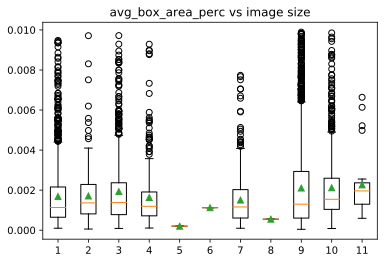

In [21]:
szs = np.asarray([sz[0]*sz[1] for sz in image_sizes]); plt.title('avg_box_area_perc vs image size')
avg_area_perc = np.asarray(avg_area_perc)
avg_area_perc_by_sz = []
for sz in list(set(szs)):
    avg_area_part = avg_area_perc[szs==sz]
    avg_area_part = avg_area_part[avg_area_part < 0.01]
    avg_area_perc_by_sz.append(avg_area_part)
plt.boxplot(avg_area_perc_by_sz, showmeans=True);
plt.show()

### #-of-box vs image size

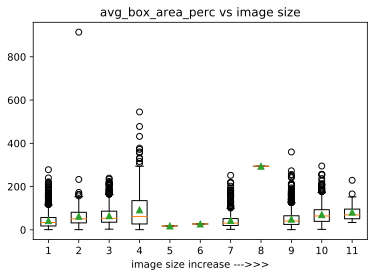

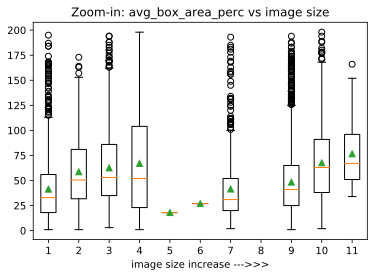

In [22]:
szs = np.asarray([sz[0]*sz[1] for sz in image_sizes]); plt.title('avg_box_area_perc vs image size')
num_box_by_sz = []
for sz in list(set(szs)):
    num_box_by_sz.append(box_num[szs==sz])
plt.boxplot(num_box_by_sz, showmeans=True); plt.xlabel('image size increase --->>>')
plt.show()

# zoom-in
num_box_by_sz = []
for sz in list(set(szs)):
    num_box_part = box_num[szs==sz]
    num_box_part = num_box_part[num_box_part < 200]
    num_box_by_sz.append(num_box_part)
plt.boxplot(num_box_by_sz, showmeans=True); plt.xlabel('image size increase --->>>')
plt.title('Zoom-in: avg_box_area_perc vs image size');plt.show()

# Per class Anylysis

**whlr_cls include [w, h, length=(w+h)/w, ratio = w/h]***

In [23]:
CLASSES = ["pedestrian","people","bicycle","car","van","truck","tricycle","awning-tricycle","bus","motor"]

In [24]:
# get stats
# whlr_cls include [w, h, length=(w+h)/2, ratio=w/h]
box_cls, whlr_cls = [], []
for i, (box_info, info) in enumerate(zip(boxes_info, infos)):
    box_, whlr_ = [], []
    for c in range(1, 11):
        box_.append(box_info[info[:, 5] == c])
        wh_ = (info[:, 2:4][info[:, 5] == c]).astype(np.float32)
        l = (wh_[:, 0] + wh_[:, 1]) / 2
        #find non zero of h
        if (wh_[:,1] == 0).any():
            ind_ = np.argwhere(wh_[:,1]==0)
            print(i, ind_)
            wh_[ind_, 1] = wh_[ind_, 0]

        r = wh_[:, 0] / (wh_[:, 1] + 1e-7)
        whlr_.append(np.stack([wh_[:,0], wh_[:,1], l, r], axis=1))
    box_cls.append(box_)
    whlr_cls.append(whlr_)

# get stats, discard diff image and merge into big table
box_cls_all, whlr_cls_all = [np.empty([0,4]) for i in range(10)], [np.empty([0,4]) for i in range(10)]
for box_info, info in zip(boxes_info, infos):
    for c in range(1, 11):
        box_cls_all[c-1] = np.concatenate([box_cls_all[c-1], (box_info[info[:, 5] == c])], axis=0)
        wh_ = (info[:, 2:4][info[:, 5] == c]).astype(np.float32)
        l = (wh_[:, 0] + wh_[:, 1]) / 2
        #find non zero of h
        if (wh_[:,1] == 0).any():
            ind_ = np.argwhere(wh_[:,1]==0)
            wh_[ind_, 1] = wh_[ind_, 0]

        r = wh_[:, 0] / (wh_[:, 1] + 1e-7)
        whlr_cls_all[c-1] = np.concatenate([whlr_cls_all[c-1],(np.stack([wh_[:,0], wh_[:,1], l, r], axis=1))],axis=0)

346 [[0]]


## Box num by class

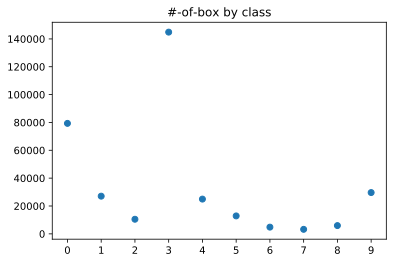

dived by #-of-imgs
 [12.26039252  4.18157935  1.6195333  22.38711173  3.85659094  1.98964611
  0.74362541  0.50162262  0.91577809  4.58151754]


In [25]:
num_box_by_cls = np.asarray([b.shape[0] for b in box_cls_all])
plt.plot(num_box_by_cls, 'o');plt.xticks(np.arange(10)); plt.title('#-of-box by class')
plt.show()
print('dived by #-of-imgs\n', num_box_by_cls / 6471)

## Anylysis of length(width/height),rather than area

['23', '20', '30', '45', '50', '64', '42', '45', '66', '27']


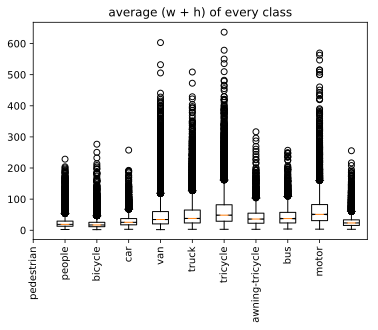

In [26]:
len_by_cls = [(v[:,2]) for v in whlr_cls_all]
print(['%d' % np.mean(v) for v in len_by_cls])
plt.boxplot(len_by_cls, 'o'); plt.title('average (w + h) of every class');plt.xticks(np.arange(10))
ax = plt.gca(); ax.set_xticklabels(CLASSES, rotation='vertical');plt.show()

['23', '20', '30', '45', '50', '64', '42', '45', '66', '27']


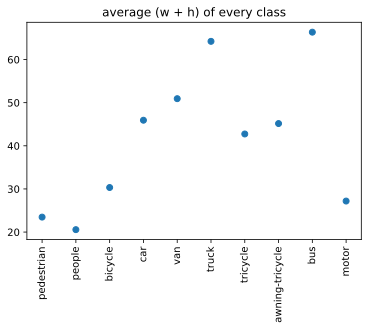

In [27]:
len_by_cls = [np.mean(v[:,2]) for v in whlr_cls_all]
print(['%d' % np.mean(v) for v in len_by_cls])
plt.plot(len_by_cls, 'o'); plt.title('average (w + h) of every class');plt.xticks(np.arange(10))
ax = plt.gca(); ax.set_xticklabels(CLASSES, rotation='vertical');plt.show()

## width:height Ratio and by classes

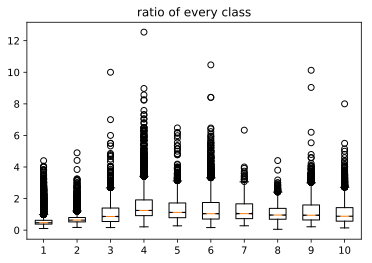

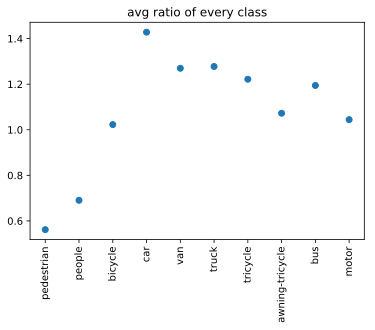

In [28]:
ratio_by_cls = [(v[:,3]) for v in whlr_cls_all]
plt.boxplot(ratio_by_cls, 'o'); plt.title('ratio of every class');
plt.show()

ratio_by_cls = [np.mean(v[:,3]) for v in whlr_cls_all]
plt.plot(ratio_by_cls, 'o'); plt.title('avg ratio of every class');plt.xticks(np.arange(10))
ax = plt.gca(); ax.set_xticklabels(CLASSES, rotation='vertical');plt.show()

# err ano? h = 0

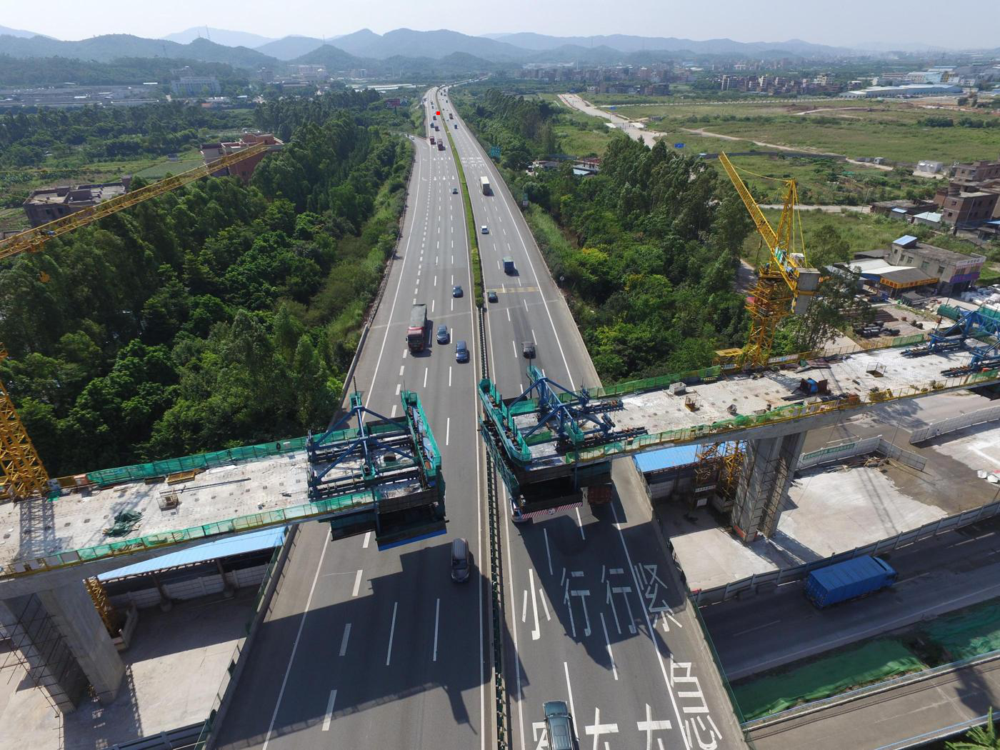

In [29]:
img = get_image_from_ind(346)
visualization_utils.draw_bounding_box_on_image(img, *boxes_info[346][11])
img

# width and height pixels of all class

In [30]:
whlr_all = np.concatenate(whlr_cls_all, axis=0)
print(whlr_all.shape)

(343205, 4)


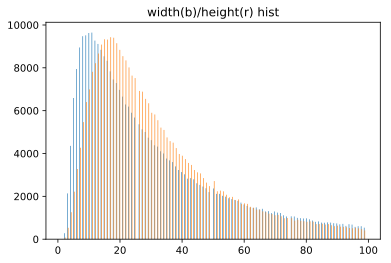

In [31]:
whlr_part_w = whlr_all[whlr_all[:,0] < 100]
plt.title('width(b)/height(r) hist')
whlr_part_h = whlr_all[whlr_all[:,1] < 100]
plt.hist([whlr_part_w[:,0], whlr_part_h[:, 1]], bins=200);
plt.show()

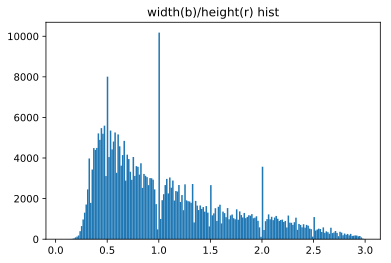

In [32]:
whlr_part = whlr_all[whlr_all[:,3] < 3]
plt.title('width(b)/height(r) hist')
plt.hist(whlr_part[:,3], bins=200);
plt.show()

[0.60466776 0.33974447 0.05529057]


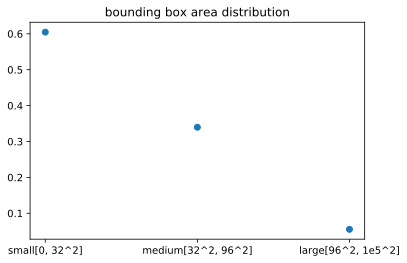

In [34]:
bbareas = whlr_all[:, 0] * whlr_all[:, 1]
areaRng = [0**2, 32**2, 96**2, 1e5 **2]
bbareas_in_range = []
for i in range(len(areaRng)-1):
    alow, ahigh = areaRng[i], areaRng[i+1]
    bbarea_in = bbareas[np.logical_and(bbareas > alow, bbareas < ahigh)]
    bbareas_in_range.append(len(bbarea_in))
bbareas_in_range = np.asarray(bbareas_in_range) / len(bbareas)
print(bbareas_in_range)
plt.plot(['small[0, 32^2]', 'medium[32^2, 96^2]', 'large[96^2, 1e5^2]'], bbareas_in_range, 'o' )
plt.title('bounding box area distribution')
plt.show()